<a href="https://colab.research.google.com/github/hxy1337/assignment2/blob/main/201886490_Relationship_Between_Regional_Employment_Levels_and_Local_Car_Ownership_Rates_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#TOPIC: Is There a Relationship Between Regional Employment Levels and Local Car Ownership Rates?  

In [1]:
#input necessary tools and packages
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

## Introduction

The topic of this study is to investigate whether employment in a particular area is related to the level of car ownership in that area. For this purpose, I have chosen **Leeds, UK** as the case study region.  

In order to obtain the necessary data, I downloaded four CSV files from [https://www.nomisweb.co.uk/](https://www.nomisweb.co.uk/). These files contain:  
- The percentage of car ownership,  
- The percentage of employment,  
- Data based on two types of area divisions in Leeds: LSOA (Lower Layer Super Output Area) and MSOA (Middle Layer Super Output Area).  

These datasets serve as the primary data sources for this research.  

LSOA data were used to analyze data relationships and to generate non-spatial graphs, while MSOA data were used to produce spatial graphs.

To enable the creation of spatial maps, I downloaded the MSOA boundary data for the whole of the UK from [https://geoportal.statistics.gov.uk/](https://geoportal.statistics.gov.uk/). After further processing, I extracted and organized the MSOA regions specific to the city of Leeds.

##Loading data



In [2]:
#read the csv data about economic and car based on LSOA.
economic_lsoa=pd.read_csv('https://raw.githubusercontent.com/hxy1337/assignment2/refs/heads/main/leeds_economic_lsoa.csv')
car_lsoa=pd.read_csv('https://raw.githubusercontent.com/hxy1337/assignment2/refs/heads/main/leeds_car_lsoa.csv')

##Explore data

In [3]:
economic_lsoa.head()

,2021 super output area - lower layer,mnemonic,Total: All usual residents aged 16 years and over,Economically active (excluding full-time students),Economically active (excluding full-time students):In employment,Economically active (excluding full-time students): Unemployed,Economically active and a full-time student,Economically active and a full-time student:In employment,Economically active and a full-time student: Unemployed,Economically inactive,Economically inactive: Retired,Economically inactive: Student,Economically inactive: Looking after home or family,Economically inactive: Long-term sick or disabled,Economically inactive: Other
0,Leeds 001A,E01011698,100.0,58.3,55.8,2.5,1.9,1.6,0.3,39.9,30.8,3.7,1.9,1.6,1.9
1,Leeds 001B,E01011699,100.0,54.1,53.3,0.8,1.6,1.3,0.4,44.3,37.6,2.6,1.4,1.1,1.5
2,Leeds 001C,E01011701,100.0,54.9,53.2,1.7,1.6,1.2,0.3,43.5,34.2,3.8,1.9,2.0,1.6
3,Leeds 001D,E01011702,100.0,54.4,52.7,1.7,1.5,1.4,0.2,44.1,33.7,4.4,3.4,1.2,1.4
4,Leeds 001E,E01011703,100.0,37.7,36.1,1.6,1.2,0.7,0.5,61.1,51.9,3.1,3.0,1.0,2.2


In [4]:
car_lsoa.head()

,2021 super output area - lower layer,mnemonic,Total: All households,No cars or vans in household,1 car or van in household,2 cars or vans in household,3 or more cars or vans in household
0,Leeds 001A,E01011698,100.0,14.4,40.8,37.0,7.8
1,Leeds 001B,E01011699,100.0,6.9,44.9,38.0,10.2
2,Leeds 001C,E01011701,100.0,10.6,40.1,41.9,7.4
3,Leeds 001D,E01011702,100.0,7.8,28.8,47.1,16.3
4,Leeds 001E,E01011703,100.0,6.0,40.6,42.0,11.3


In [5]:
#check whether Dtype is suitable for analysing and which vairables were contained
economic_lsoa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 488 entries, 0 to 487
Data columns (total 15 columns):
 #   Column                                                            Non-Null Count  Dtype  
---  ------                                                            --------------  -----  
 0   2021 super output area - lower layer                              488 non-null    object 
 1   mnemonic                                                          488 non-null    object 
 2   Total: All usual residents aged 16 years and over                 488 non-null    float64
 3   Economically active (excluding full-time students)                488 non-null    float64
 4   Economically active (excluding full-time students):In employment  488 non-null    float64
 5   Economically active (excluding full-time students): Unemployed    488 non-null    float64
 6   Economically active and a full-time student                       488 non-null    float64
 7   Economically active and a full-time

In [6]:
#check whether Dtype is suitable for analysing
car_lsoa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 488 entries, 0 to 487
Data columns (total 7 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   2021 super output area - lower layer  488 non-null    object 
 1   mnemonic                              488 non-null    object 
 2   Total: All households                 488 non-null    float64
 3   No cars or vans in household          488 non-null    float64
 4   1 car or van in household             488 non-null    float64
 5   2 cars or vans in household           488 non-null    float64
 6   3 or more cars or vans in household   488 non-null    float64
dtypes: float64(5), object(2)
memory usage: 26.8+ KB


###Preliminary checking and findings
After some exploration, there are many different indicators were found in the economic data. For futher analysis, one indicator from the economic data as variable 1, and one indicator from the car ownership data as variable 2 will be selected for further analysis.

each data has no "null" variable.

Before conducting a detailed analysis, processing the data, doing some cleaning steps and exploring the overall relationships between these variables are needed.


##Merging the Data  
Merge these two data be one dataset and
Visualization techniques are used to explore the relationships between different variables. Based on these preliminary plots, two appropriate variables was selected to help answer the core research question.

In [7]:
# convert the columns string to lower case for easy to operate
economic_lsoa.columns=economic_lsoa.columns.str.lower()
car_lsoa.columns=car_lsoa.columns.str.lower()

###Join data

In [8]:
#join the two datas to one dataset, explore the relationship between these variables, they have same Geographic code: "mnemonic"
carEconomic_leeds_lsoa=pd.merge(economic_lsoa,car_lsoa,on='mnemonic',how='outer')
carEconomic_leeds_lsoa.head()

,2021 super output area - lower layer_x,mnemonic,total: all usual residents aged 16 years and over,economically active (excluding full-time students),economically active (excluding full-time students):in employment,economically active (excluding full-time students): unemployed,economically active and a full-time student,economically active and a full-time student:in employment,economically active and a full-time student: unemployed,economically inactive,...,economically inactive: student,economically inactive: looking after home or family,economically inactive: long-term sick or disabled,economically inactive: other,2021 super output area - lower layer_y,total: all households,no cars or vans in household,1 car or van in household,2 cars or vans in household,3 or more cars or vans in household
0,Leeds 011A,E01011264,100.0,53.9,51.9,2.0,1.4,0.6,0.7,44.7,...,2.9,2.2,3.7,2.7,Leeds 011A,100.0,19.1,46.7,26.6,7.6
1,Leeds 009A,E01011265,100.0,60.8,59.0,1.8,1.1,0.8,0.4,38.0,...,4.1,2.9,3.8,1.3,Leeds 009A,100.0,24.5,48.7,23.0,3.8
2,Leeds 008A,E01011266,100.0,68.2,67.2,1.0,1.3,1.1,0.2,30.6,...,3.2,2.4,1.0,1.5,Leeds 008A,100.0,7.8,45.4,37.5,9.2
3,Leeds 009B,E01011267,100.0,57.0,54.9,2.1,1.5,1.1,0.4,41.5,...,5.0,3.1,4.8,2.4,Leeds 009B,100.0,23.2,46.5,23.5,6.8
4,Leeds 010A,E01011268,100.0,60.2,56.6,3.5,1.5,1.4,0.2,38.3,...,3.6,5.2,7.2,3.7,Leeds 010A,100.0,32.4,43.1,18.1,6.4


In [9]:
#check the new dataset information
carEconomic_leeds_lsoa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 488 entries, 0 to 487
Data columns (total 21 columns):
 #   Column                                                            Non-Null Count  Dtype  
---  ------                                                            --------------  -----  
 0   2021 super output area - lower layer_x                            488 non-null    object 
 1   mnemonic                                                          488 non-null    object 
 2   total: all usual residents aged 16 years and over                 488 non-null    float64
 3   economically active (excluding full-time students)                488 non-null    float64
 4   economically active (excluding full-time students):in employment  488 non-null    float64
 5   economically active (excluding full-time students): unemployed    488 non-null    float64
 6   economically active and a full-time student                       488 non-null    float64
 7   economically active and a full-time

##Non-spatial part

###Preliminary data cleaning

Data cleaning is a crucial step to ensure the reliability and accuracy of subsequent analyses (Kross & Guo, 2021).

To explore the relationships between the new variables, the **scatter plot** will be used to visualize their overall patterns. However, as the dataset contains unnecessary columns (such as those of type `object`), a new dataframe was created to containing only columns of type `float64`, thereby cleaning the data before visualization.

In [10]:
# clean the object dtype and check it
float_carEconomic_leeds_lsoa = carEconomic_leeds_lsoa.select_dtypes(exclude=['object'])
float_carEconomic_leeds_lsoa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 488 entries, 0 to 487
Data columns (total 18 columns):
 #   Column                                                            Non-Null Count  Dtype  
---  ------                                                            --------------  -----  
 0   total: all usual residents aged 16 years and over                 488 non-null    float64
 1   economically active (excluding full-time students)                488 non-null    float64
 2   economically active (excluding full-time students):in employment  488 non-null    float64
 3   economically active (excluding full-time students): unemployed    488 non-null    float64
 4   economically active and a full-time student                       488 non-null    float64
 5   economically active and a full-time student:in employment         488 non-null    float64
 6   economically active and a full-time student: unemployed           488 non-null    float64
 7   economically inactive              

###Explore the general relationship
Since using **pairplot** to visualize the relationships among all 18 variables would lead to excessive response time, and considering that plots showing relationships among economic variables themselves and among car variables themselves are not necessary, Clean data is important, so **for loops** was used to iteratively plot each economic variable against each car variable. This will save time and make it more efficient to select specific variable pairs for further analysis.

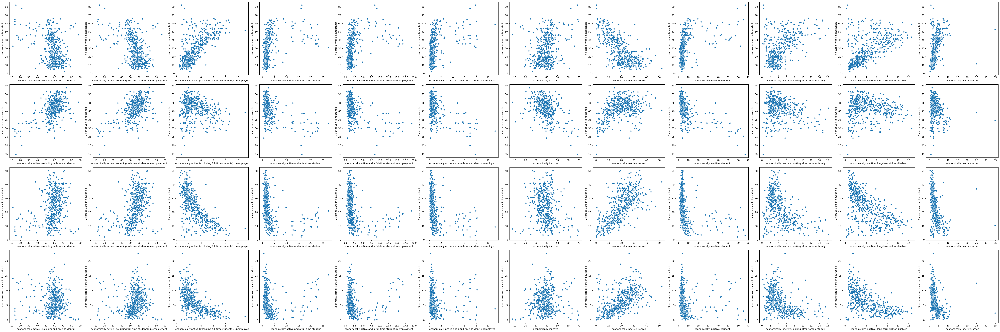

In [15]:
# Select variable columns （clean data）
economic_cols = float_carEconomic_leeds_lsoa.columns[1:13]  # Exclude the first column: "total: all usual residents aged 16 years and over"
car_cols = float_carEconomic_leeds_lsoa.columns[-4:]  # Exclude columns before the last 4: only use car ownership variables, skip "total: all households"

# Create a subplot grid with rows equal to the number of car variables
# and columns equal to the number of economic variables
fig, axes = plt.subplots(len(car_cols), len(economic_cols), figsize=(5*len(economic_cols), 5*len(car_cols)))

# Iterate over all combinations of car and economic variables  (learned from: https://sider.ai/chat chatgpt 4.1)
for i, y_col in enumerate(car_cols):       # Loop through car variables (used for y-axis)
    for j, x_col in enumerate(economic_cols):  # Loop through economic variables (used for x-axis)
        sns.scatterplot(
            x=float_carEconomic_leeds_lsoa[x_col],
            y=float_carEconomic_leeds_lsoa[y_col],
            ax=axes[i, j]  # Draw on the appropriate subplot
        )
        axes[i, j].set_xlabel(x_col)    # Set x-axis label as economic variable name
        axes[i, j].set_ylabel(y_col)    # Set y-axis label as car variable name

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

###Futher analysis
Based on the results of this exploratory analysis and the generated scatter plots, there appears to be a relationship between household car ownership and employment status. The scatter plots suggest both positive and negative approximately linear relationships, with some outliers—possibly due to the influence of student groups or other confounding factors.

To further investigate these relationships, statistical modeling is applied for deeper analysis. Specifically, the correlation coefficients **(heatmap)** is to better understand the association between the selected variables.

###statistical modelling：Correlation analysis model

###Justification:
The correlation coefficient model was chosen because both variables——economic status and car ownership status——are continuous and regionally aggregated. Correlation analysis effectively quantifies the strength and direction of their relationship, which is especially suitable for large, non-categorical datasets. The scatter plot indicates a clear trend, further supporting the choice of this model.

###Interpretation:
The correlation coefficient measures the linear relationship between the two variables. A value closer to 1 or -1 indicates a strong relationship, whether positive or negative. In this case, the result helps us understand how changes in unemployment rates are associated with changes in car ownership across regions.

In [11]:
#input relevant tools
import numpy as np

In [12]:
#create a new data for excluding irrelevant columns （clean data）
cols_to_exclude = ['total: all usual residents aged 16 years and over', 'total: all households']
corrCalculate_cols= float_carEconomic_leeds_lsoa.drop(columns=cols_to_exclude)

In [13]:
# calculate the correlation
corr = corrCalculate_cols.corr(method='spearman')

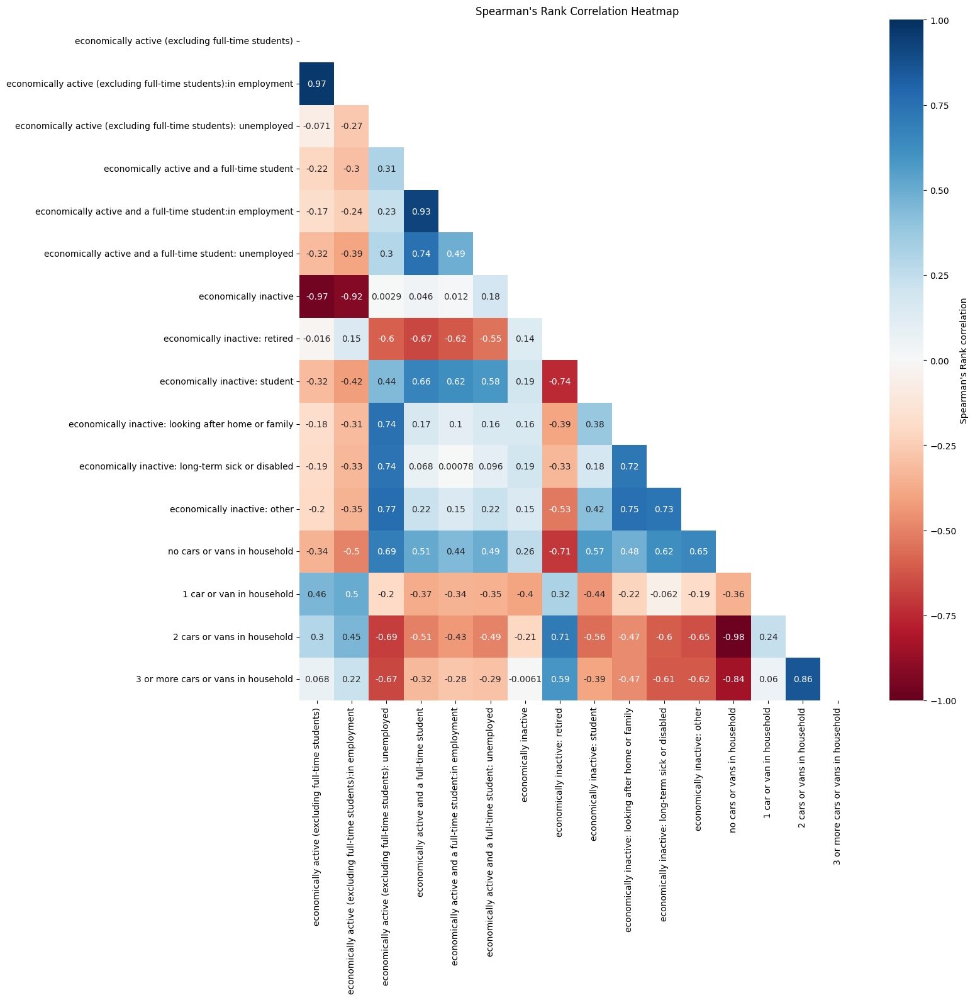

In [14]:
# set the mask to heatmap
mask = np.triu(np.ones_like(corr, dtype=bool))

# create the heatmap
fig, ax = plt.subplots(figsize=(16, 16))
sns.heatmap(
    corr,                               # relevant correlation numbers
    annot=True,                         # show the numbers
    cmap='RdBu',                        # colors
    vmin=-1, vmax=1,                    # Color mapping value
    mask=mask,                          # mask the redundant part
    cbar_kws={'label': "Spearman's Rank correlation"},  # label for bar
    ax=ax
)
plt.title("Spearman's Rank Correlation Heatmap")
plt.tight_layout()
plt.show()

### After the correlation analysis
Based on the heatmap generated above, the correlation coefficients among the variables were obtained. To address the research topic—Is There a Relationship Between Regional Employment Levels and Local Car Ownership Rates—these two variables with relatively high correlation coefficients were selected: **‘economically active (excluding full-time students): unemployed’** and **‘no cars or vans in household’**.


###Subsequent data cleaning

Based on the scatter plot above and the correlation heatmap analysis, the decision to further clean the data is well supported. The two variables were selected --**‘economically active (excluding full-time students): unemployed’** and **‘no cars or vans in household’**. All categorical variables were assessed for consistency, and redundant or duplicate entries were removed to prevent distortion in the analysis (Rahm & Do, 2000).

Unemployment is widely recognized as a key indicator of economic hardship, which can limit access to private transportation (Lucas, 2012)

In [17]:
# clean data - exclude unnecessary variables and retaine only the two selected variables.
SelectedData1=float_carEconomic_leeds_lsoa[['economically active (excluding full-time students): unemployed','no cars or vans in household']]
SelectedData1.head()

,economically active (excluding full-time students): unemployed,no cars or vans in household
0,2.0,19.1
1,1.8,24.5
2,1.0,7.8
3,2.1,23.2
4,3.5,32.4


In [18]:
corr2 = SelectedData1.corr(method='spearman')
corr2

,economically active (excluding full-time students): unemployed,no cars or vans in household
economically active (excluding full-time students): unemployed,1.000000,0.694065
no cars or vans in household,0.694065,1.000000


###correlation coefficients: 0.69

##Non-spatial visualisation and justification

In this part, **seaborn.jointplot** was mainly used to visualize the relationship between the percentage of households without a car and the unemployment rate in Leeds. One of the reason for choosing joinplot is that These two sets of data are not categorical data, and both consist of a large number of values. To simultaneously display the relationship between two datasets and their individual distributions, jointplot is the optimal choice.

The **main advantage** of a jointplot is that it allows us to **simultaneously visualize** both the relationship between two variables and the individual distributions of each variable (Waskom, 2021). Jointplot shows both a scatterplot of two variables and their marginal distributions, helping to detect trends, clusters, and outliers (Waskom, 2021). Seaborn provides colorblind-friendly palettes (like #0072B2), ensuring visualizations are accessible to all viewers (Waskom, 2021).
The method helps in making critical visualisation choices—the combined approach is more informative than a single scatterplot or histogram. Alternative visualisations, such as plain scatterplots or heatmaps, were considered less effective for conveying both joint relationships and individual distributions simultaneously (Brewer, 2013).

In the main figure, I chose colorblind-friendly colors, thickened the bottom-left axis lines, and adjusted the font size to ensure that the labels are clearly readable for viewers. Additionally, a fitted regression line (in dark violet) overlays the scatter, visually highlighting the linear trend in the data, to aid interpretation (Tufte, 2001).


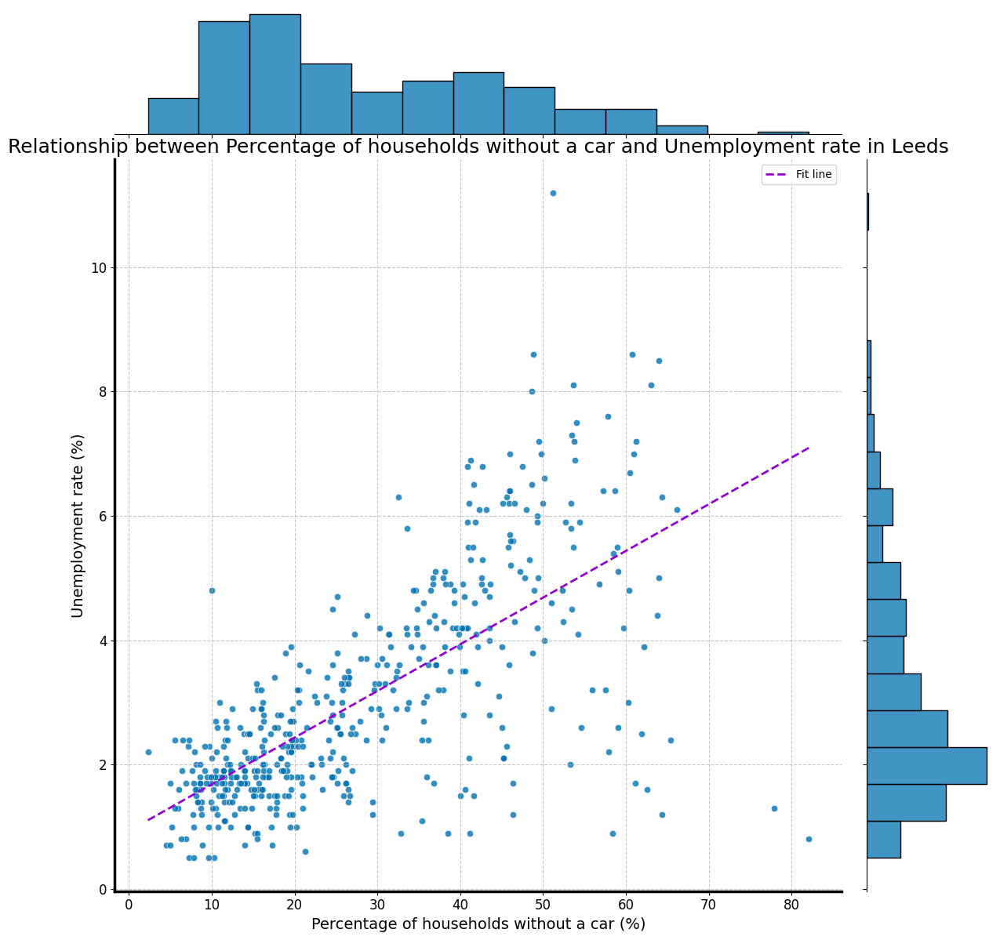

In [78]:
# Data visualisation
# Draw a jointplot, cause The main advantage of sns.jointplot is to simultaneously visualize the relationship between two variables and understand their individual distributions.
mainPLot=sns.jointplot(
    data = SelectedData1,# select the data
    x="no cars or vans in household", # set the x-axis variable
    y="economically active (excluding full-time students): unemployed",# set the x-axis variable
    color="#0072B2", # set a lightbule color for main plot and good for colorblind people
    alpha=0.8, # transparency about the element in plot
    height=12 # make the plot bigger
)

# set a fit line （learned from https://chatgpt.com/ chatgpt-3.5）
x = SelectedData1["no cars or vans in household"]  # parameter x
y = SelectedData1["economically active (excluding full-time students): unemployed"]  #parameter2

coef = np.polyfit(x, y, deg=1)                    # get the slope
line = np.poly1d(coef)                            # Create a line function using the fit coefficients
x_vals = np.linspace(min(x), max(x), 100)         # generate 100 evenly spaced x-values between min and max
mainPLot.ax_joint.plot(x_vals, line(x_vals), color='darkviolet', linestyle='--', linewidth=2, label="Fit line")  # show line

# set the title,label and legend suitably
mainPLot.ax_joint.set_title("Relationship between Percentage of households without a car and Unemployment rate in Leeds", fontsize=18) # set the title and modify the fontsize
mainPLot.ax_joint.set_xlabel("Percentage of households without a car (%)", fontsize=14) # set the x label and modify the fontsize
mainPLot.ax_joint.set_ylabel("Unemployment rate (%)", fontsize=14) # set the y label and modify the fontsize
mainPLot.ax_joint.grid(True, linestyle="--", alpha=0.7) #set a gird for reference(True is a bool, to control the switch of grid, and other parameter for setting the grid style. linestyle for set the linestyle, alpha for setting the transparency)

# make xticks and yticks more clear
mainPLot.ax_joint.tick_params(axis='both', labelsize=12)

# make the axis thicker
mainPLot.ax_joint.spines["bottom"].set_linewidth(2.5)# parameter in [] for select the position of axis and set_linewidth is a method to modify the width of axis
mainPLot.ax_joint.spines["left"].set_linewidth(2.5)

mainPLot.ax_joint.legend()

plt.show()

##Discussion and answer the topic question
The unemployment rate and the proportion of households without a car are generally positively correlated, with a correlation coefficient of **0.69**. This indicates that areas with higher unemployment rates tend to also have a higher percentage of households without access to a car.
From a socioeconomic perspective, car ownership is often considered an indicator of economic well-being and access to resources. Individuals or households with limited financial means may be less likely to afford a car, while unemployment can further restrict mobility and access to job opportunities (Currie & Delbosc, 2011).

##Spatial visualisation part

In [65]:
# input relevant packages and tools
!pip install contextily
!pip install geoplot
!pip install git+https://github.com/pmdscully/geo_northarrow.git
import geopandas as gpd
import geoplot as gplt
import geoplot.crs as gcrs
from geo_northarrow import add_north_arrow
import contextily as ctx
import matplotlib as mpl

  Cloning https://github.com/pmdscully/geo_northarrow.git to /tmp/pip-req-build-x5svsz02
  Running command git clone --filter=blob:none --quiet https://github.com/pmdscully/geo_northarrow.git /tmp/pip-req-build-x5svsz02
  Resolved https://github.com/pmdscully/geo_northarrow.git to commit 963bdd271707a3bcaa47b2d83d92b88ae0b10950
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


###Data selected for spatial visualisation
To avoid visual clutter caused by the large number of LSOA-level data points in the spatial visualization, MSOA-level data is used instead. This provides a clearer and more interpretable map. Only the two previously selected variables are included in this visualization, as they have already been analyzed in detail. No additional variables are introduced, and the analysis process is not repeated here.

In [20]:
#read relevant files
economic_msoa=pd.read_csv('https://raw.githubusercontent.com/hxy1337/assignment2/refs/heads/main/leeds_economic_msoa.csv')
car_msoa=pd.read_csv('https://raw.githubusercontent.com/hxy1337/assignment2/refs/heads/main/leeds_car_msoa.csv')
leeds=gpd.read_file('https://raw.githubusercontent.com/hxy1337/assignment2/main/Leeds_msoa_FeaturesToJSON.geojson')

In [79]:
#check data1
economic_msoa.head()

,2021 super output area - lower layer,mnemonic,total: all usual residents aged 16 years and over,economically active (excluding full-time students),economically active (excluding full-time students):in employment,economically active (excluding full-time students): unemployed,economically active and a full-time student,economically active and a full-time student:in employment,economically active and a full-time student: unemployed,economically inactive,economically inactive: retired,economically inactive: student,economically inactive: looking after home or family,economically inactive: long-term sick or disabled,economically inactive: other
0,Leeds 001,E02002330,100.0,52.1,50.4,1.7,1.6,1.3,0.3,46.3,37.3,3.6,2.3,1.4,1.7
1,Leeds 002,E02002331,100.0,47.6,45.9,1.8,1.2,0.9,0.3,51.2,29.9,2.7,2.5,5.6,10.5
2,Leeds 003,E02002332,100.0,57.8,55.6,2.2,1.5,1.0,0.5,40.6,29.2,3.2,3.1,3.3,1.8
3,Leeds 004,E02002333,100.0,57.3,55.6,1.7,1.6,1.3,0.3,41.1,30.8,2.9,2.8,3.1,1.5
4,Leeds 005,E02002334,100.0,55.8,54.6,1.3,1.7,1.3,0.5,42.4,32.5,3.5,3.0,2.0,1.4


In [80]:
#check data2
car_msoa.head()

,2021 super output area - lower layer,mnemonic,total: all households,no cars or vans in household,1 car or van in household,2 cars or vans in household,3 or more cars or vans in household
0,Leeds 001,E02002330,100.0,9.2,38.8,41.3,10.7
1,Leeds 002,E02002331,100.0,20.7,43.6,28.3,7.3
2,Leeds 003,E02002332,100.0,16.9,43.5,31.0,8.6
3,Leeds 004,E02002333,100.0,20.7,46.0,26.4,6.9
4,Leeds 005,E02002334,100.0,12.6,37.7,38.3,11.4


In [81]:
#check data3
leeds.head()

,fid,msoa21cd,msoa21nm,msoa21nmw,bng_e,bng_n,lat,long,globalid,geometry
0,0,E02002330,Leeds 001,,439371,447994,53.926601,-1.40193,4ae5336d-c69d-4691-b6ba-939306d1d2d2,"POLYGON ((440369.188 449848.047, 440360.711 44..."
1,1,E02002331,Leeds 002,,442708,447639,53.923100,-1.35117,dad62ba7-ca22-427c-b23b-e7621f402140,"POLYGON ((443381.688 450063.5, 443410.281 4501..."
2,2,E02002332,Leeds 003,,419730,446090,53.910599,-1.70115,a5110b57-514e-44b7-b45f-cb131ab30db5,"POLYGON ((419488.188 446933.687, 419479.605 44..."
3,3,E02002333,Leeds 004,,420298,445045,53.901199,-1.69257,689fe504-866a-4502-85d5-eeee496198c8,"POLYGON ((422941.192 446149.652, 422938 446156..."
4,4,E02002334,Leeds 005,,441960,443308,53.884300,-1.36315,ebd1e143-a385-4226-b521-a0fec1a3582d,"POLYGON ((442102 446256, 442102 446264, 442108..."


In [24]:
# convert the columns string to lower case for easy to operate
economic_msoa.columns=economic_lsoa.columns.str.lower()
car_msoa.columns=car_lsoa.columns.str.lower()
leeds.columns = leeds.columns.str.lower()

In [25]:
# join data (merge these three data together)
carEconomic_leeds_msoa=pd.merge(economic_msoa,car_msoa,on='mnemonic',how='outer')
carEconomic_leeds_msoa_geo=leeds.merge(carEconomic_leeds_msoa,left_on='msoa21cd',right_on='mnemonic')


In [77]:
carEconomic_leeds_msoa_geo.explore() # check whether this data is in GeoDataFrame

In [27]:
# clean data (Select the two variables previously chosen from the non-spatial part and relevant geo data)
selectData2 = carEconomic_leeds_msoa_geo[
    ['economically active (excluding full-time students): unemployed',
     'no cars or vans in household',
     'geometry',
     'msoa21cd']
]
selectData2.head()

,economically active (excluding full-time students): unemployed,no cars or vans in household,geometry,msoa21cd
0,1.7,9.2,"POLYGON ((440369.188 449848.047, 440360.711 44...",E02002330
1,1.8,20.7,"POLYGON ((443381.688 450063.5, 443410.281 4501...",E02002331
2,2.2,16.9,"POLYGON ((419488.188 446933.687, 419479.605 44...",E02002332
3,1.7,20.7,"POLYGON ((422941.192 446149.652, 422938 446156...",E02002333
4,1.3,12.6,"POLYGON ((442102 446256, 442102 446264, 442108...",E02002334


### Separate one of the spatial datasets and check the coordinate transformation.
Since in spatial maps we can usually only visualize one variable using color gradients, we separate out another variable and represent it independently as points on the map

In [28]:
point=selectData2.copy() # copy a new 'selectData2' and call 'point'
point['geometry'] = point.geometry.centroid # Calculates the centroid of each geometry


In [29]:
selectData2.crs #check their coordination

<Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.01, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [30]:
point.crs

<Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.01, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [31]:
selectData2=selectData2.to_crs(epsg=3857)
point=point.to_crs(epsg=3857)

###Spatial visualisation and justification

To ensure accessibility for all audiences, especially those with colour vision deficiencies, I selected colour-blind friendly colour maps—specifically, viridis for unemployment rate and magma_r for the percentage of carless households (Brewer, 2013; Wong, 2011). These colormaps are widely recommended for perceptual uniformity and accessibility. Map boundaries are clarified with semi-transparent dark edges for better separation (Wilke, 2019).

Legends and titles are carefully styled and positioned for clarity. The background map serves as a geographical reference without distracting from thematic layers.

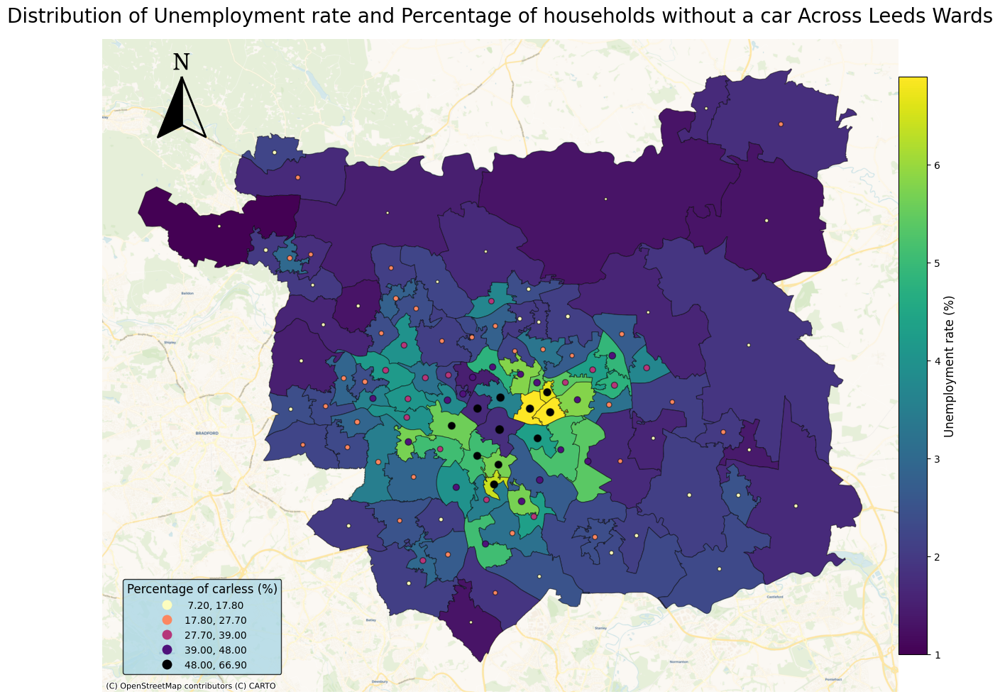

In [76]:
# Data Visualisation
fig, ax = plt.subplots(figsize=(15, 15)) # set the size of subplots

layer1 = selectData2.plot( # define first layer and column base on variable:'economically active (excluding full-time students): unemployed'
    ax = ax,
    column = 'economically active (excluding full-time students): unemployed',
    legend = False,  #do not show the legend automatically
    cmap = 'viridis',  #select a suitable color and good for colorblind people
    linewidth = 0.8, #set boundaries for each ward and adjust its line width
    edgecolor = (0, 0, 0, 0.5), #prompt: learned from AI ChatGPT-3.5: The fourth parameter adjusts the opacity of boundaries.
)

layer2 = point.plot( #define second layer and column base on bus stop numbers in each wards
    ax = ax,
    markersize = point['no cars or vans in household'], # adjust the marksize base on the percentage of no car household
    column = 'no cars or vans in household',
    cmap = 'magma_r', #select a suitable color and good for colorblind people
    edgecolor = (0, 0, 0, 0.5),
    legend = True, #generate a automatic legend
    k = 5, #classify the legend to 5 class base on 'natural_breaks' method.
    scheme = 'natural_breaks',
)

# create the legend for layer1 manually
lengend1COlor = plt.cm.ScalarMappable( #Prompt: Learned from AI ChatGPT-3.5, to create a new 'scalarMappable' which as the color of layer1
    cmap = 'viridis',
    # Normalize the color scale range; vmin and vmax represent the minimum and maximum values of the data.
    norm = mpl.colors.Normalize(
        vmin = selectData2['economically active (excluding full-time students): unemployed'].min(),
        vmax = selectData2['economically active (excluding full-time students): unemployed'].max())
)
# prompt: Learned from AI, to draw a colorbar as the legend for first layer
legend1 = fig.colorbar(
    lengend1COlor, # choose above scalarMappable as the range of color
    ax = ax,
    fraction = 0.035, #the width of the bar
    pad = 0.0 #the distance between the main plot and colorbar
    )

legend1.set_label( #give a title for legend1
    'Unemployment rate (%)',
    fontsize = 12 #control the font size
    )

#adjust the legend 2 appropriately
legend2 = layer2.get_legend()
legend2.set_title('Percentage of carless (%)') #set a title
legend2.get_title().set_fontsize(12) #adjust text size
legend2.set_bbox_to_anchor((0.02, 0.02)) #adjust the position of legend 2

#prompt: learned from AI ChatGPT-3.5: set a frame for legend 2
legend2.set_frame_on(True)
legend2.get_frame().set_edgecolor('black') # set the frame color to black
legend2.get_frame().set_facecolor('lightblue') # change the background color to lightblue

#set a background map
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Voyager,
    zoom = 13,
    crs = selectData2.crs
    )

# set a main title fron whole plot
ax.set_title('Distribution of Unemployment rate and Percentage of households without a car Across Leeds Wards', fontsize=20)

#set a north arrow
add_north_arrow(
    ax = ax,
    scale = .75, # the size of Arrow
    # the position of north arrow in this map
    xlim_pos = 0.1,
    ylim_pos = .85,
    color = '#000',
    text_scaler = 2, # the "N" size
    text_yT = 6.25) # adjust the "N" to suitable position

ax.set_axis_off() # close the axis for good looking



##Reproducibility
All data and analysis steps in my assignment have been clearly documented and organized, ensuring full reproducibility. The datasets used and all code/scripts are provided, so that anyone can follow the same process to reproduce the results. This guarantees that my analysis is transparent and can be independently verified.

Should you wish to investigate the relationships between other variables, you simply need to substitute the variable names used in this study with the appropriate variable names from the dataset, which have already been standardized to lowercase.

##Reference
Brewer, C.A., 2013. *Guidelines for Use of Colour in Mapping and Visualization.* [online]. [Accessed 10 May 2025]. Available from: https://www.personal.psu.edu/cab38/ColorSch/SchHome.html

Currie, G. & Delbosc, A., 2011. ‘Understanding transport disadvantage: Evidence from the Victorian Survey of Travel Patterns’. *Urban Policy and Research.* [online]. 29(3), pp. 249–267. [Accessed 10 May 2025]. Available from: https://doi.org/10.1080/08111146.2011.578168.

Kross, S. and Guo, P.J., 2021. *Data Cleaning: Overview and Emerging Challenges.* [online]. [Accessed 10 May 2025]. Available from: https://hdsr.mitpress.mit.edu/pub/8gjd9fr7/release/2

Lucas, K.,2012. Transport and social exclusion: Where are we now? *Transport Policy.* [Online]. 20, 105-113.[Accessed 10 May 2025]. Available from: https://doi.org/10.1016/j.tranpol.2012.01.013

Rahm, E., and Do, H.H., 2000. Data Cleaning: Problems and Current Approaches. *IEEE Data Engineering Bulletin.* [online]. 23(4), pp.3–13. [Accessed 10 May 2025]. Available from: https://homepages.cwi.nl/~manegold/teaching/alapm-ss05/papers/rahm00data.pdf

Tufte, E.R., 2001. *The Visual Display of Quantitative Information.* [online]. 2nd Edition. Graphics Press. [Accessed 10 May 2025]. Available from: https://www.edwardtufte.com/tufte/books_vdqi

Waskom, M.L., 2021. *Seaborn: statistical data visualization.* [online]. [Accessed 10 May 2025]. Available from: https://seaborn.pydata.org/

Wilke, C.O., 2019. *Fundamentals of Data Visualization.* [online].[Accessed 10 May 2025]. Available from: https://clauswilke.com/dataviz/

Wong, B., 2011. *Color blindness. Nature Methods.* [online]. 8(6), p.441. [Accessed 10 May 2025]. Available from: https://www.nature.com/articles/nmeth.1618


